<a href="https://colab.research.google.com/github/afifrahmann/Employee-Attrition-Project/blob/master/Employee_Attrition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Employee Attrition Prediction**

In [ ]:
#Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

#### Understanding Business Problem
Problem : Sloth Company want to know which aspects drive the employee to attrite.

Objective: Create a model to predict potentional employee attrition with performance model above 75%.

Success Metric: Attrition Rate (%)

User: HR Team


### **1. Data Exploration**

In [ ]:
# Data Extraction

In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = '/content/drive/MyDrive/RAKAMIN ACADEMY BATCH 33/DATA DYNASTY/WA_Fn-UseC_-HR-Employee-Attrition.csv'
df = pd.read_csv(path)
df.sample(2)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
916,46,No,Travel_Rarely,168,Sales,4,2,Marketing,1,1280,4,Female,33,2,5,Manager,2,Married,18789,9946,2,Y,No,14,3,3,80,1,26,2,3,11,4,0,8
623,30,No,Travel_Frequently,1012,Research & Development,5,4,Life Sciences,1,861,2,Male,75,2,1,Research Scientist,4,Divorced,3761,2373,9,Y,No,12,3,2,80,1,10,3,2,5,4,0,3


### **2. EDA**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                



The data consist of 1470 rows and 35 columns.
there is no missing values.

Tipe data kurang sesuai :
* Education
* EviromentSatisfication
* JobInvloment
* JobLevel
* Jobsatisfaction
* PerformanceRating
* RelationshipSatisfaction
* StockOptionLevel
* WorkLifeBalance




##### **Univariate Analysis**

In [ ]:
# Split Data Type

In [ ]:
nums = ['Age', 'DailyRate', 'DistanceFromHome', 'EmployeeCount', 'EmployeeNumber', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'StandardHours', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
cats = ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance']

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [ ]:
# Categorical-Univariate Analysis

In [ ]:
df[cats].describe()

,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,2.912925,2.721769,2.729932,2.063946,2.728571,3.153741,2.712245,0.793878,2.761224
std,1.024165,1.093082,0.711561,1.106940,1.102846,0.360824,1.081209,0.852077,0.706476
min,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,1.000000,0.000000,1.000000
25%,2.000000,2.000000,2.000000,1.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,3.000000,3.000000,3.000000,2.000000,3.000000,3.000000,3.000000,1.000000,3.000000
75%,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,1.000000,3.000000
max,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,3.000000,4.000000


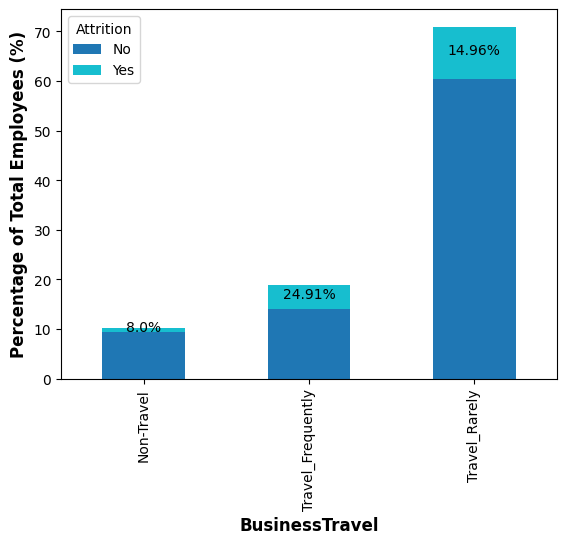

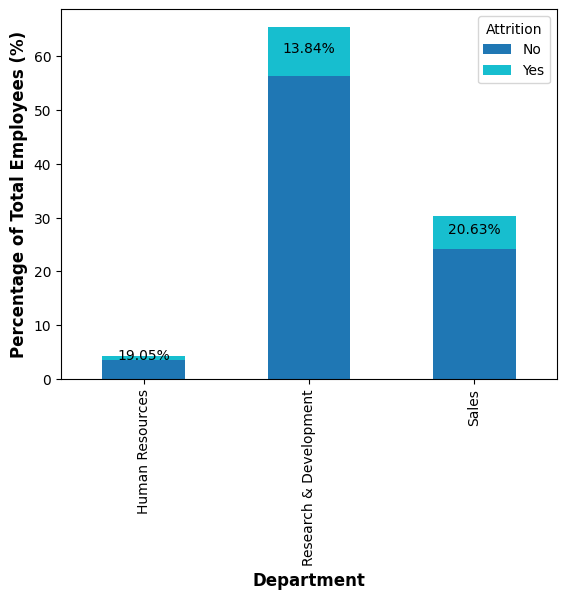

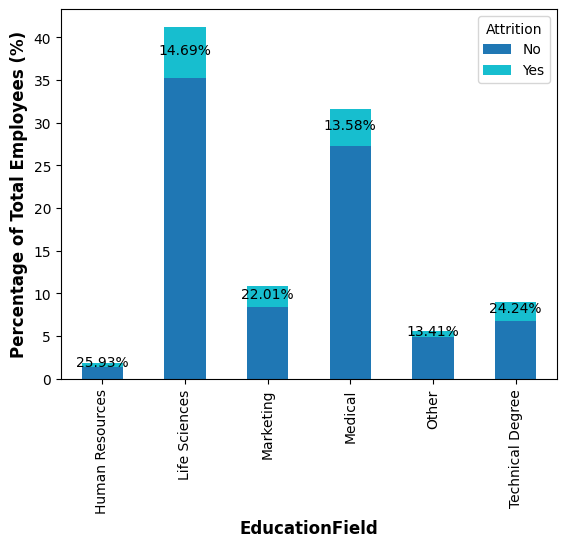

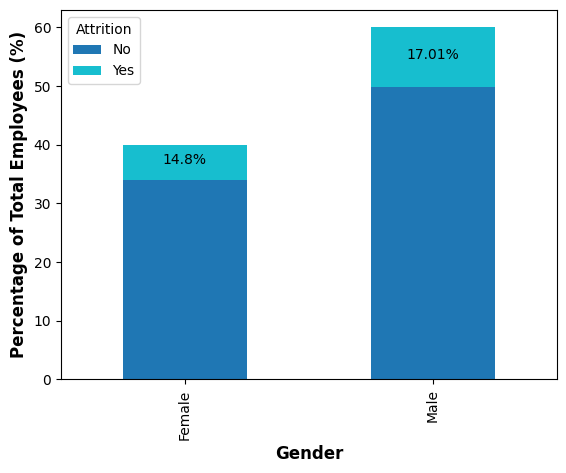

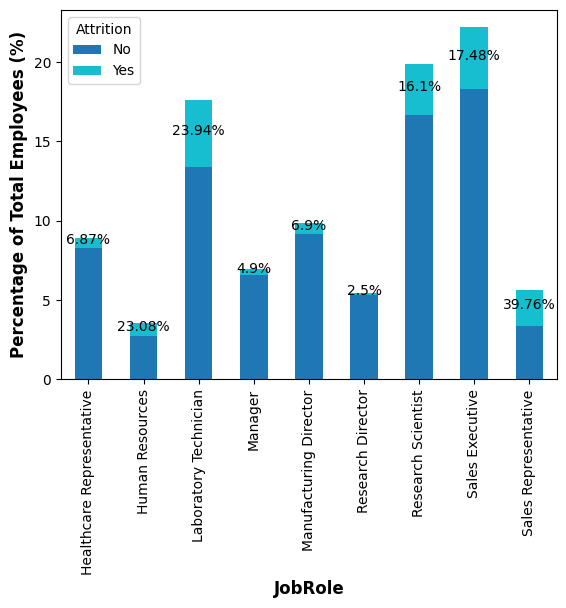

...

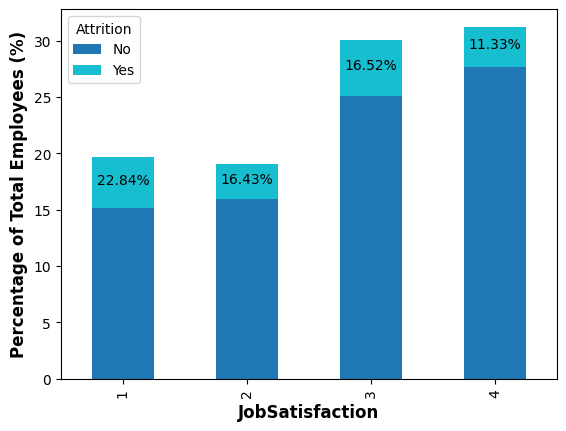

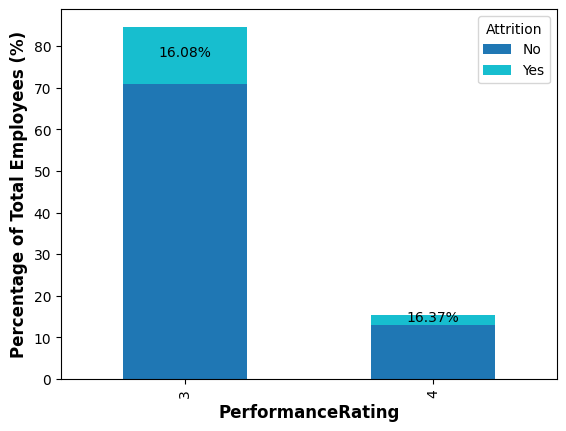

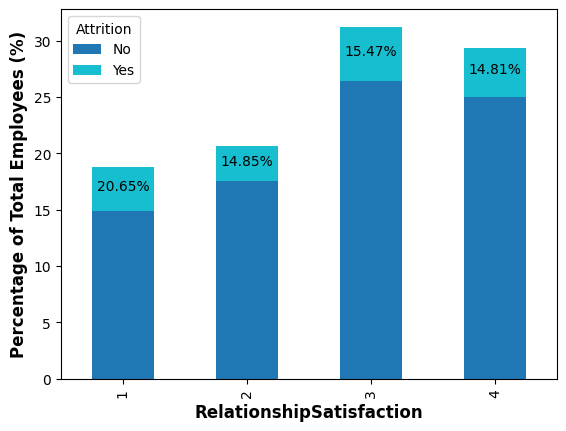

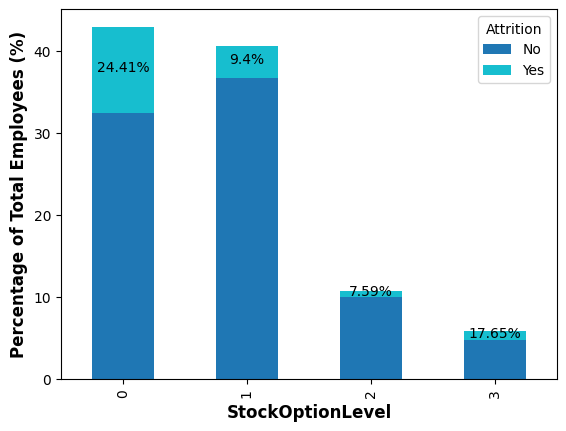

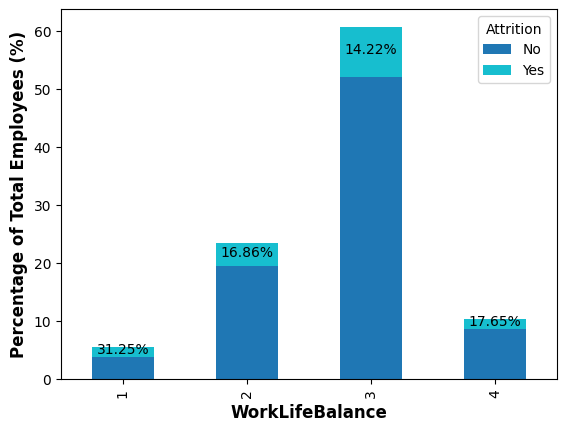

In [ ]:
# Visualisasi barplot presentase fitur kategorik terhadap target

for col in cats:
  if col != 'Attrition':
    dfg = df.groupby([col, 'Attrition'])['EmployeeNumber'].nunique().reset_index()

    dfg_a = df.groupby([col, 'Attrition'])['EmployeeNumber'].nunique().reset_index()
    dfg = df.groupby(col)['EmployeeNumber'].nunique().reset_index()

    dfg['total_df'] = [1470 for y in range(df[col].nunique())]

    dfg.rename(columns={'EmployeeNumber':'total_fitur'}, inplace=True)
    dfg_a.rename(columns={'EmployeeNumber':'subtotal'}, inplace=True)
    dfg_merge = dfg_a.merge(dfg, how='left')
    dfg_merge['ratio'] = round(dfg_merge['subtotal']/dfg_merge['total_df']*100, 2)
    dfg_merge['sub_ratio']=round(dfg_merge['subtotal']/dfg_merge['total_fitur']*100, 2)

    dfg_merge1 = dfg_merge.pivot_table(index=col, columns='Attrition', values='sub_ratio')
    dfg_merge2 = dfg_merge.pivot_table(index=col, columns='Attrition', values='ratio')

    dfg_merge2

    bar = dfg_merge2.plot(kind = 'bar', stacked = True, colormap = 'tab10')
    for i in bar.containers[int(len(bar.containers)/2):]:
        bar.bar_label(i, padding = 2, fmt = "{:0,.2f}%", label_type='center', labels = [f'{x}%' for x in dfg_merge1['Yes'].values])
    plt.ylabel('Percentage of Total Employees (%)', fontsize=12, fontweight = 'bold')
    plt.xlabel(col, fontsize=12, fontweight = 'bold')
    plt.show()


In [ ]:
# Numerical-Univariate Analysis

In [ ]:
#summary data numerikal
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


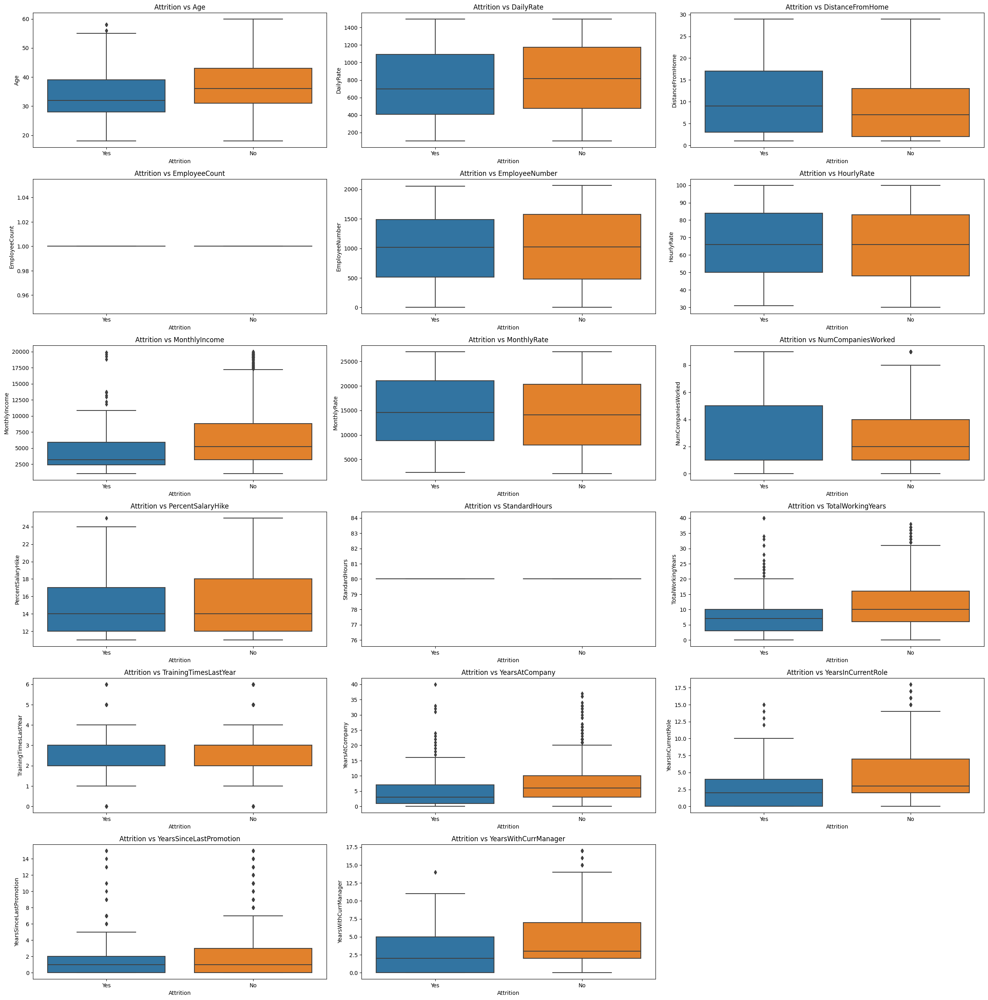

In [ ]:
plt.figure(figsize=(25, 50))
for i, feature in enumerate(nums, 1):
    plt.subplot(12, 3, i)
    sns.boxplot(data=df, x='Attrition', y=feature)
    plt.title(f'Attrition vs {feature}')

plt.tight_layout()
plt.show()

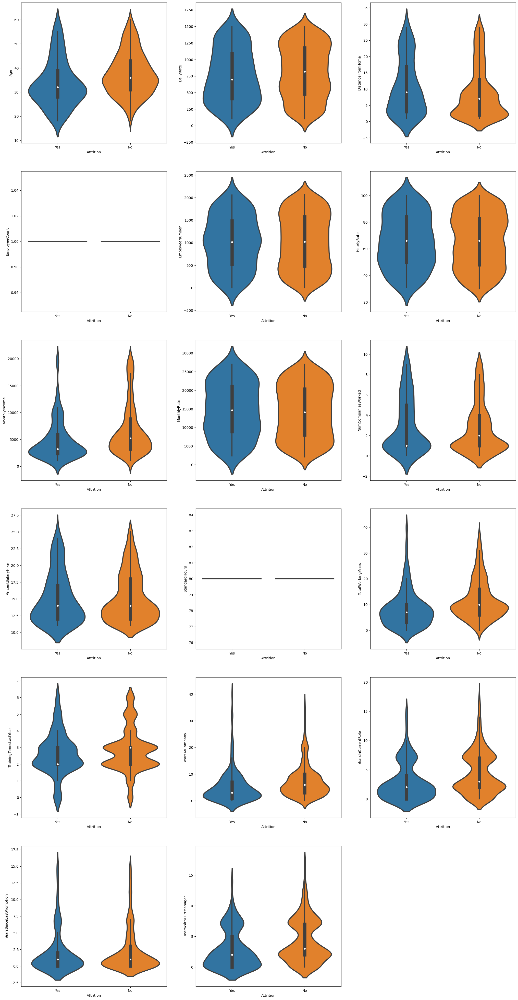

In [ ]:
import math

plt.figure(figsize=(25, 50))
for i in range (0, len(nums)):
  plt.subplot(math.ceil(len(nums)/3), 3, i+1)
  sns.violinplot(data=df, y=nums[i], x='Attrition', linewidth=3, orient='v')
plt.savefig('uninum.png')

In [ ]:
# Outlier Check

##### **Bivariate Analysis**

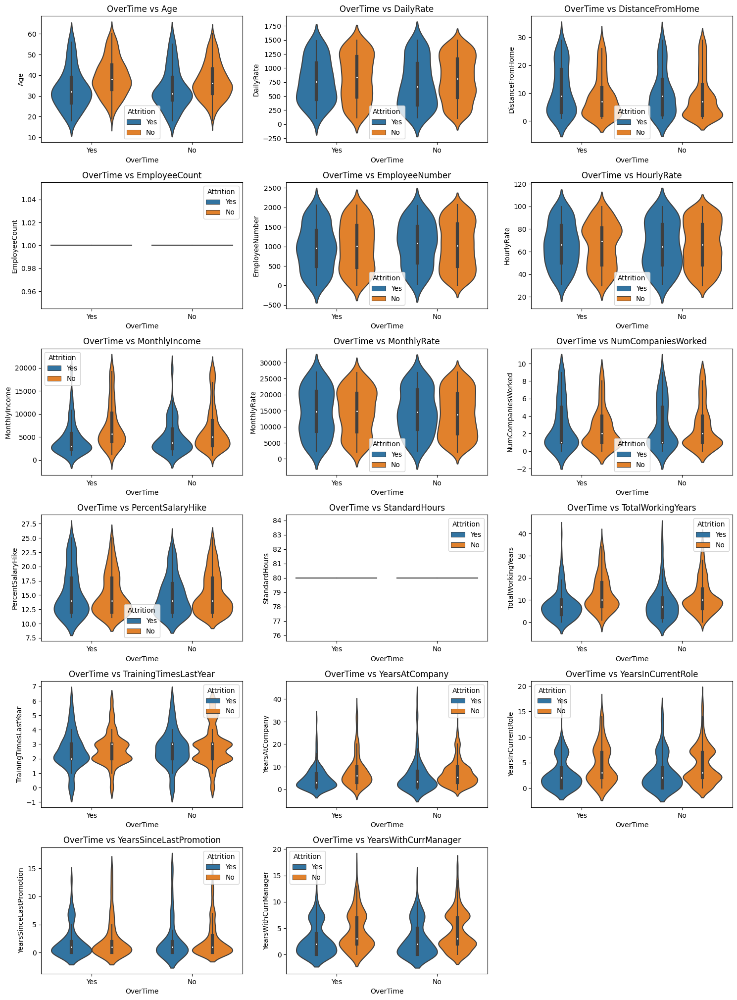

In [ ]:
# Categorical-Bivariate Analysis
plt.figure(figsize=(15,40))
for i, feature in enumerate(nums,1):
    plt.subplot(12,3,i)
    sns.violinplot(data=df, x='OverTime', y=feature, hue='Attrition')
    plt.title(f'OverTime vs {feature}')
plt.tight_layout()
plt.show()

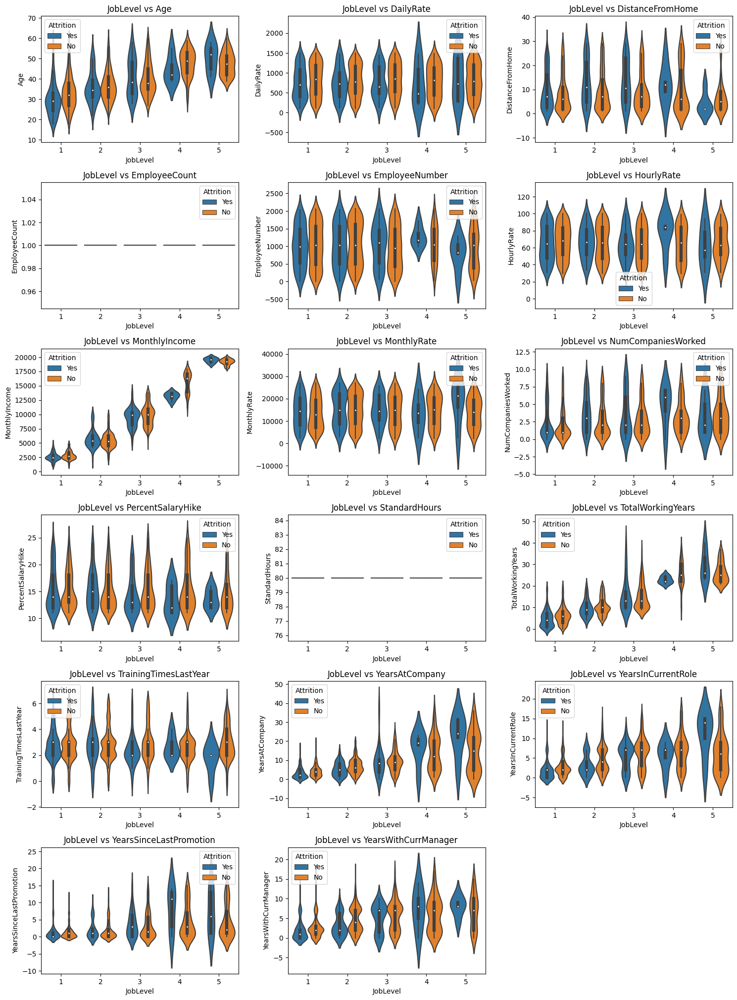

In [ ]:
plt.figure(figsize=(15,40))
for i, feature in enumerate(nums,1):
    plt.subplot(12,3,i)
    sns.violinplot(data=df, x='JobLevel', y=feature, hue='Attrition')
    plt.title(f'JobLevel vs {feature}')
plt.tight_layout()
plt.show()

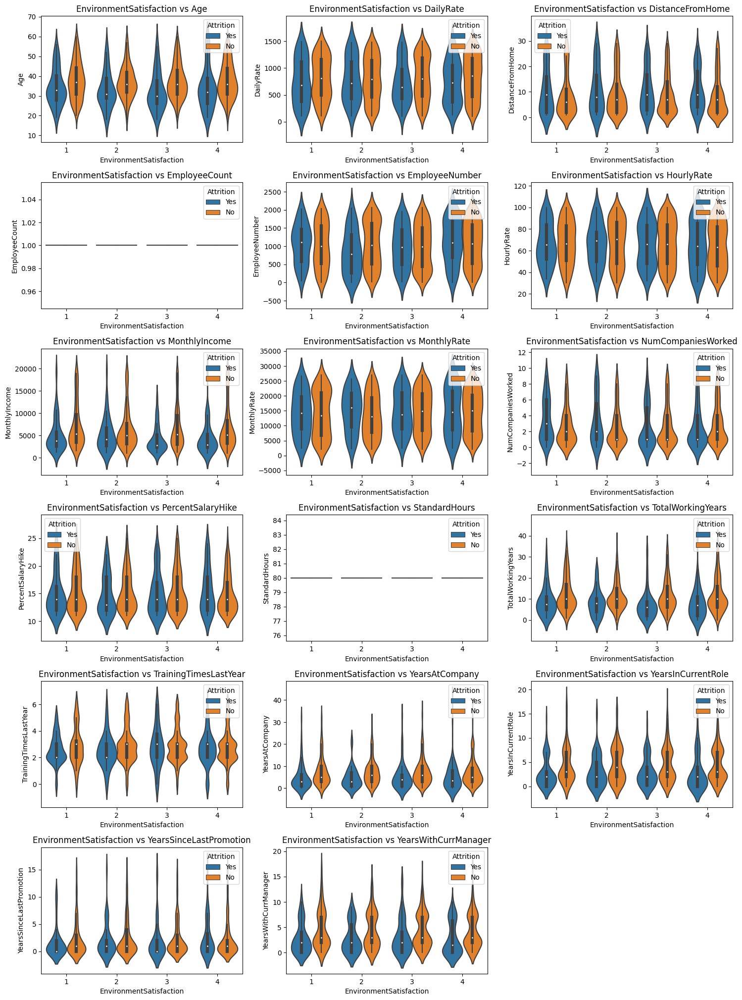

In [ ]:
plt.figure(figsize=(15,40))
for i, feature in enumerate(nums,1):
    plt.subplot(12,3,i)
    sns.violinplot(data=df, x='EnvironmentSatisfaction', y=feature, hue='Attrition')
    plt.title(f'EnvironmentSatisfaction vs {feature}')
plt.tight_layout()
plt.show()

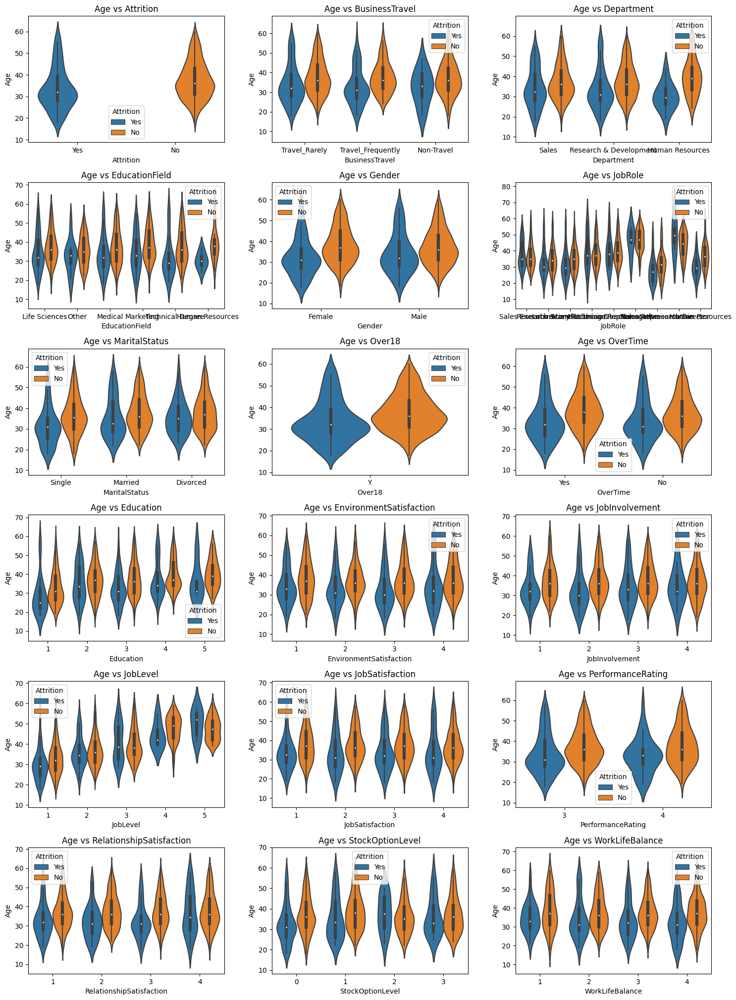

In [ ]:
plt.figure(figsize=(15,40))
for i, feature in enumerate(cats,1):
    plt.subplot(12,3,i)
    sns.violinplot(data=df, x=feature, y='Age', hue='Attrition')
    plt.title(f'Age vs {feature}')
plt.tight_layout()
plt.show()

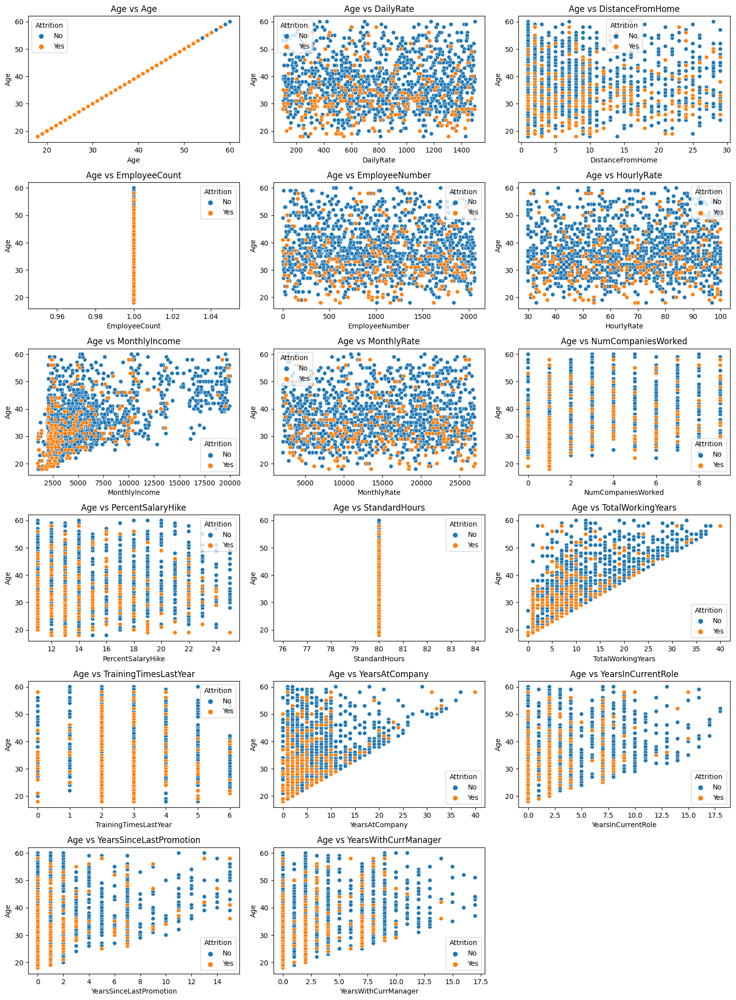

In [ ]:
# Numerical-Bivariate Analysis
df_sorted = df.sort_values(by='Attrition')

plt.figure(figsize=(15, 40))
for i, feature in enumerate(nums, 1):
    plt.subplot(12, 3, i)
    sns.scatterplot(data=df_sorted, x=feature, y='Age', hue='Attrition')
    plt.title(f'Age vs {feature}')
    plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

##### **Multivariate Analysis**

Text(0.5, 1.0, 'Confusion Matrix')

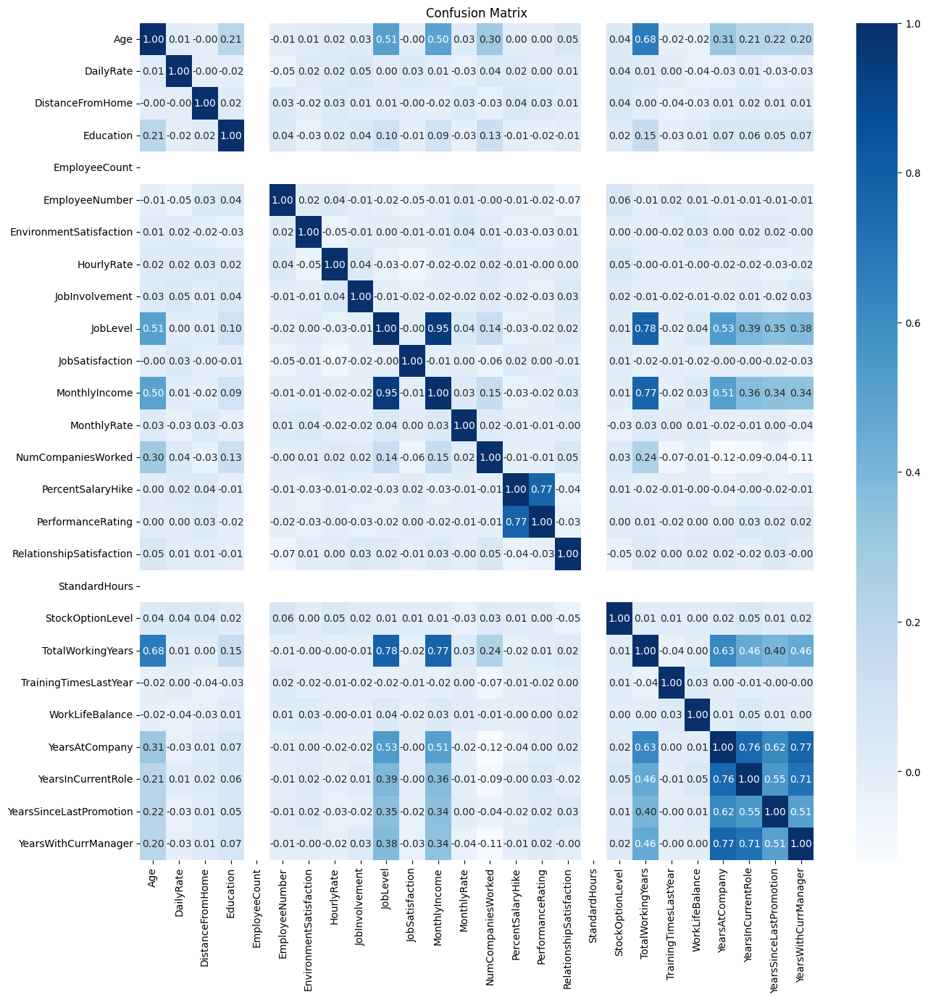

In [ ]:
#Heatmap correlation
plt.figure(figsize=(15, 15))
sns.heatmap(df.corr(), cmap='Blues', annot=True, fmt='.2f')
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Pairplot')

<Figure size 1500x1500 with 0 Axes>

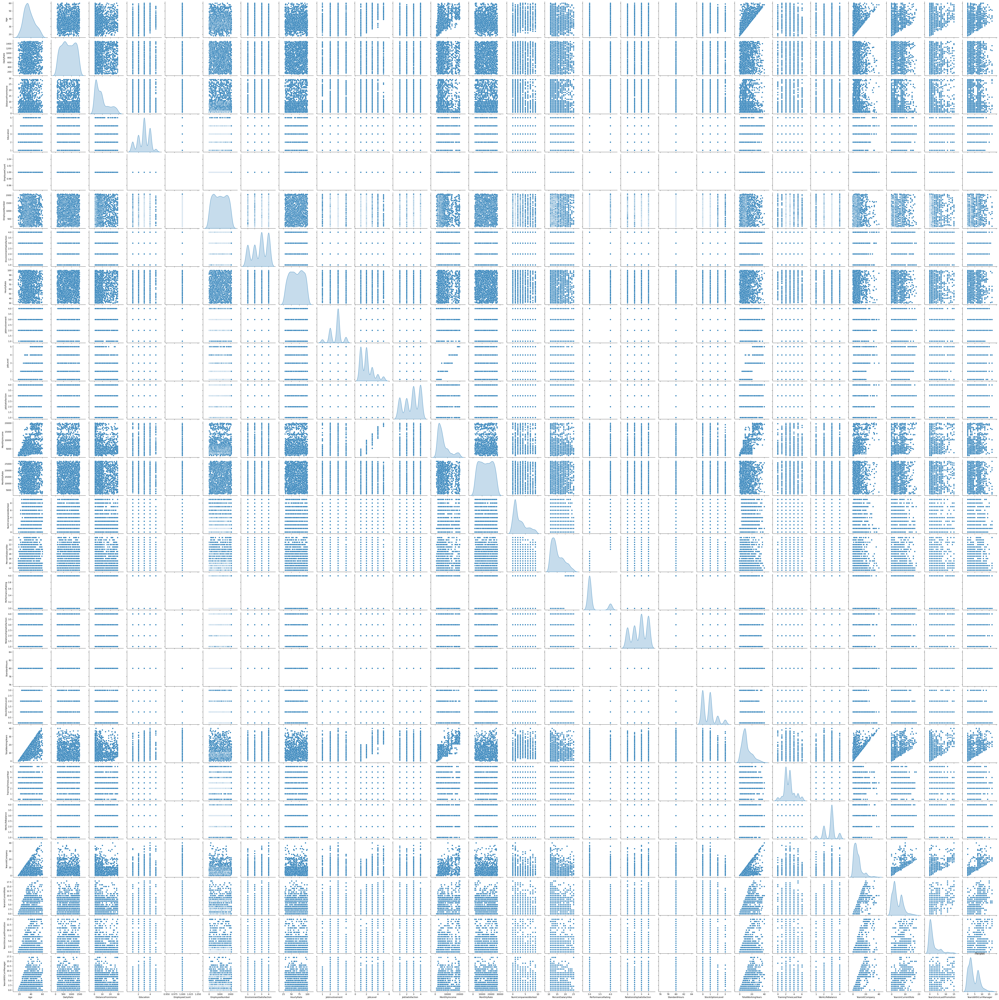

In [ ]:
plt.figure(figsize=(15, 15))
sns.pairplot(df, diag_kind='kde')
plt.title('Pairplot')

### **3. Data Pre-Processing**

##### **Data Cleansing**

##### *Missing, Duplicated,Feature selection*

In [ ]:
df.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [ ]:
df.duplicated().sum()

0

In [ ]:
df = df.drop(columns=['EmployeeNumber', 'EmployeeCount', 'Over18', 'StandardHours'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

##### *Feature Engineering*

In [ ]:
nums = ['Age', 'DailyRate', 'DistanceFromHome','HourlyRate', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike','TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
cats = ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus','OverTime', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance']

In [ ]:
df[cats].head()

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Yes,2,2,3,2,4,3,1,0,1
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,No,1,3,2,2,2,4,4,1,3
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Yes,2,4,2,1,3,3,2,0,3
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Yes,4,4,3,1,3,3,3,0,3
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,No,1,1,3,1,2,3,4,1,3


In [ ]:
df['Attrition'] = df['Attrition'].replace({'No':0,'Yes':1})
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


In [ ]:
#Label Encoding

cat_1=['Gender','OverTime']
cat_cols = []
for col in cat_1:
    map_dict = {k:i for i, k in enumerate(df[col].value_counts().index,0)}
    df[col] = df[col].map(map_dict)
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,1,94,3,2,Sales Executive,4,Single,5993,19479,8,1,11,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,0,61,2,2,Research Scientist,2,Married,5130,24907,1,0,23,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,0,92,2,1,Laboratory Technician,3,Single,2090,2396,6,1,15,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,1,56,3,1,Research Scientist,3,Married,2909,23159,1,1,11,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,0,40,3,1,Laboratory Technician,2,Married,3468,16632,9,0,12,3,4,1,6,3,3,2,2,2,2


In [ ]:
print(df.columns)

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')


In [ ]:
#One Hot Encoding
cat_2=['Department','BusinessTravel', 'EducationField', 'JobRole', 'MaritalStatus']
for cat in cat_2[:]:
   nominal_encoded = pd.get_dummies(df[cat], prefix=cat)
   df = pd.concat([df, nominal_encoded], axis=1)
for column in df.columns:
 if df[column].dtype == object and column != 'Attrition':
    df.drop(column, axis = 1, inplace = True)

In [ ]:
df.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Department_Human Resources,Department_Research & Development,Department_Sales,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,41,1,1102,1,2,2,1,94,3,2,4,5993,19479,8,1,11,3,1,0,8,0,1,6,4,0,5,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,49,0,279,8,1,3,0,61,2,2,2,5130,24907,1,0,23,4,4,1,10,3,3,10,7,1,7,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,37,1,1373,2,2,4,0,92,2,1,3,2090,2396,6,1,15,3,2,0,7,3,3,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
3,33,0,1392,3,4,4,1,56,3,1,3,2909,23159,1,1,11,3,3,0,8,3,3,8,7,3,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,27,0,591,2,1,1,0,40,3,1,2,3468,16632,9,0,12,3,4,1,6,3,3,2,2,2,2,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0


##### *Train Test Split*

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

In [ ]:
nums_clean = ['Age', 'DailyRate', 'DistanceFromHome','HourlyRate', 'MonthlyIncome', 'MonthlyRate',
              'NumCompaniesWorked', 'PercentSalaryHike','TotalWorkingYears', 'TrainingTimesLastYear',
              'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 50 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   Age                                1470 non-null   int64
 1   Attrition                          1470 non-null   int64
 2   DailyRate                          1470 non-null   int64
 3   DistanceFromHome                   1470 non-null   int64
 4   Education                          1470 non-null   int64
 5   EnvironmentSatisfaction            1470 non-null   int64
 6   Gender                             1470 non-null   int64
 7   HourlyRate                         1470 non-null   int64
 8   JobInvolvement                     1470 non-null   int64
 9   JobLevel                           1470 non-null   int64
 10  JobSatisfaction                    1470 non-null   int64
 11  MonthlyIncome                      1470 non-null   int64
 12  MonthlyRate         

In [ ]:
df_sp = df.copy()

In [ ]:
X = df_sp.drop(['Attrition'],axis=1,inplace=False)
y = df_sp['Attrition']

Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.30, random_state=422, stratify = y)

##### *Handling Outlier and Imbalanced*

In [ ]:
# Handling Outlier

In [ ]:
for var in nums_clean:
  Xtrain[var]= (Xtrain[var]).apply(np.log1p)
  Xtest[var]= (Xtest[var]).apply(np.log1p)

In [ ]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()

for col in nums_clean:
  scaler = ss.fit(Xtrain[[col]])

  Xtrain[[col]] = ss.transform(Xtrain[[col]])
  Xtest[[col]] = ss.transform(Xtest[[col]])

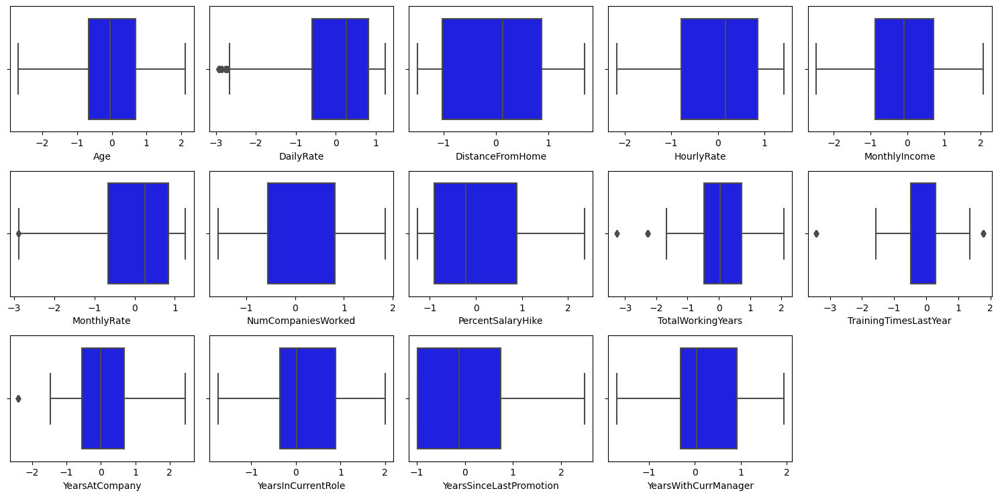

In [ ]:
plt.figure(figsize=(15, 12))
#Individual Displot
for i in range (0, len(nums_clean)):
  plt.subplot(5,5,i+1)
  sns.boxplot(x=Xtrain[nums_clean[i]],color='blue')
  plt.xlabel(nums_clean[i])
  plt.tight_layout()

In [ ]:
Xtrain.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1029 entries, 545 to 154
Data columns (total 49 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1029 non-null   float64
 1   DailyRate                          1029 non-null   float64
 2   DistanceFromHome                   1029 non-null   float64
 3   Education                          1029 non-null   int64  
 4   EnvironmentSatisfaction            1029 non-null   int64  
 5   Gender                             1029 non-null   int64  
 6   HourlyRate                         1029 non-null   float64
 7   JobInvolvement                     1029 non-null   int64  
 8   JobLevel                           1029 non-null   int64  
 9   JobSatisfaction                    1029 non-null   int64  
 10  MonthlyIncome                      1029 non-null   float64
 11  MonthlyRate                        1029 non-null   floa

In [ ]:
Xtrain.head(5)

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Department_Human Resources,Department_Research & Development,Department_Sales,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
545,-0.671277,-0.483020,1.605691,5,3,0,1.384163,3,2,4,0.049655,1.160088,1.510220,0,1.985005,4,4,1,0.186496,-0.486609,2,0.534837,0.894757,1.617008,0.915584,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
604,0.680103,0.489734,1.686778,3,2,0,1.353668,3,2,2,-0.223427,-0.082078,-0.554625,0,-0.549279,3,4,1,0.186496,0.283566,2,0.675779,1.044674,1.617008,1.064002,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
241,-0.413070,0.560254,1.562948,4,3,0,1.414355,3,2,4,-0.212808,-0.046126,-1.587047,0,0.886582,3,1,0,-0.949024,-0.486609,3,-0.549951,-0.353666,0.387409,-0.320353,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
650,0.775049,-0.751291,-1.495998,3,4,1,-1.889198,3,2,4,0.122052,0.917378,0.810163,0,-0.549279,3,2,1,0.427084,-0.486609,2,-0.007557,-0.353666,0.387409,-0.320353,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
886,-0.671277,1.196048,-1.495998,3,4,0,0.030024,3,1,2,-0.549933,-0.459347,-1.587047,1,1.575890,4,1,1,0.427084,-0.486609,3,0.919672,1.178779,1.256360,0.915584,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0


In [ ]:
# Handling imbalance data

In [ ]:
ytrain.value_counts()

0    863
1    166
Name: Attrition, dtype: int64

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy=1, random_state=4022)
Xtrain_over, ytrain_over = smote.fit_resample(Xtrain, ytrain)

print('SMOTE')
print(pd.Series(ytrain_over).value_counts())

SMOTE
0    863
1    863
Name: Attrition, dtype: int64


##### *Cek data train duplicate*



In [ ]:
df.duplicated().sum()

0

### **4. Modeling**

###### **Helper Functions**

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from imblearn.pipeline import Pipeline
import time
def eval_classification(model, smote=True):
    y_pred = model.predict(Xtest)
    y_pred_train = model.predict(Xtrain)
    y_pred_proba = model.predict_proba(Xtest)
    y_pred_proba_train = model.predict_proba(Xtrain)


    model1 = Pipeline([
        ('sampling', SMOTE(sampling_strategy=1, random_state=4022)),
        ('classification', model)
    ])

    print("Accuracy (Test Set): %.2f" % accuracy_score(ytest, y_pred))
    print("Accuracy (Train Set): %.2f" % accuracy_score(ytrain, y_pred_train))
    print("Precision (Test Set): %.2f" % precision_score(ytest, y_pred))
    print("Recall (Test Set): %.2f" % recall_score(ytest, y_pred))
    print("Recall (Train Set): %.2f" % recall_score(ytrain, y_pred_train))
    print("F1-Score (Test Set): %.2f" % f1_score(ytest, y_pred))

    print("roc_auc (test-proba): %.2f" % roc_auc_score(ytest, y_pred_proba[:, 1]))
    print("roc_auc (train-proba): %.2f" % roc_auc_score(ytrain, y_pred_proba_train[:, 1]))

    if smote==True:
      cv = RepeatedStratifiedKFold(random_state=42, n_repeats = 3)
      score = cross_validate(model1, X=Xtrain, y=ytrain, cv=cv, scoring='roc_auc', return_train_score=True)
      print('roc_auc (crossval train): '+ str(score['train_score'].mean()))
      print('roc_auc (crossval test): '+ str(score['test_score'].mean()))


def grid_pipe(pipedict, hyperdict, scoring='recall', display=True):
    fitted_models={}
    for name, pipeline in pipedict.items():
    # Construct grid search
        model = GridSearchCV(estimator=pipeline,
                             param_grid=hyperdict[name],
                             scoring=scoring,
                             cv=5, verbose=2, n_jobs=-1, return_train_score = True)

        # Fit using grid search
        start = time.time()
        model.fit(Xtrain, ytrain)
        end = time.time()

        #Append model
        fitted_models[name]=model
        if display:
            #Print when the model has been fitted
            print(f'The {name} model has been fitted.')
            # print fit time
            print('Total Fit Time: %.3fs' % (end-start))
            # Best params
            print('Best params:\n', model.best_params_,'\n')

    return fitted_models

def confusion(model):
    y_pred_proba = model.predict_proba(Xtest)
    y_predict = model.predict(Xtest)
    print('Accuracy: %.2f%%' % (accuracy_score(ytest, y_predict) * 100 ))
    print('Precision: %.2f%%' % (precision_score(ytest, y_predict) * 100))
    print('Recall: %.2f%%' % (recall_score(ytest, y_predict) * 100))
    print('F1_Score: %.2f%%' % (f1_score(ytest, y_predict) * 100))
    print('ROC_AUC: %.2f%%' % (roc_auc_score(ytest, y_pred_proba[:,1]) * 100))
    confusion_matrix_model = confusion_matrix(ytest, y_predict)
    plt.figure(figsize=(12,8))
    ax = plt.subplot()
    sns.heatmap(confusion_matrix_model, annot=True, fmt='g', ax = ax)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('Actual Label')
    ax.set_title(f'Confusion Matrix - {model}')
    ax.xaxis.set_ticklabels(['0','1'])
    ax.yaxis.set_ticklabels(['0','1'])

###### **Fit Model & Evaluation**

Untuk metrics evaluasi akan fokus kepada *Recall* dikarenakan ingin mengurangi false negative rate agar sebanyak-banyak nya employee yang akan attrition terprediksi attrition dan dapat diberikan treatment yang sesuai. Akan dieksperimen 4 model yang berbeda untuk modelling pada dataset ini yaitu; Logistic Regression, Adaboost, Random Forest, dan XGBoost, dan akan dipilih satu model terbaik berdasarkan *recall* dan *accuracy*.

**Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(Xtrain_over, ytrain_over)

eval_classification(logreg)

Accuracy (Test Set): 0.88
Accuracy (Train Set): 0.89
Precision (Test Set): 0.67
Recall (Test Set): 0.49
Recall (Train Set): 0.54
F1-Score (Test Set): 0.57
roc_auc (test-proba): 0.84
roc_auc (train-proba): 0.87
roc_auc (crossval train): 0.8775457434496668
roc_auc (crossval test): 0.8234026169829527


**Adaboost**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
ada = AdaBoostClassifier()
ada.fit(Xtrain_over, ytrain_over)
eval_classification(ada)

Accuracy (Test Set): 0.82
Accuracy (Train Set): 0.88
Precision (Test Set): 0.45
Recall (Test Set): 0.52
Recall (Train Set): 0.64
F1-Score (Test Set): 0.48
roc_auc (test-proba): 0.81
roc_auc (train-proba): 0.88
roc_auc (crossval train): 0.903072444424049
roc_auc (crossval test): 0.7811210641160905


**Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state = 402)
rf.fit(Xtrain_over, ytrain_over)

eval_classification(rf)

Accuracy (Test Set): 0.84
Accuracy (Train Set): 1.00
Precision (Test Set): 0.48
Recall (Test Set): 0.20
Recall (Train Set): 1.00
F1-Score (Test Set): 0.28
roc_auc (test-proba): 0.77
roc_auc (train-proba): 1.00
roc_auc (crossval train): 1.0
roc_auc (crossval test): 0.757793403180888


**XGBoost**

In [ ]:
from xgboost import XGBClassifier
xg = XGBClassifier(nthread=6, tree_method='hist', predictor='cpu_predictor')

xg.fit(Xtrain_over, ytrain_over)

eval_classification(xg)

Accuracy (Test Set): 0.85
Accuracy (Train Set): 1.00
Precision (Test Set): 0.59
Recall (Test Set): 0.28
Recall (Train Set): 1.00
F1-Score (Test Set): 0.38
roc_auc (test-proba): 0.77
roc_auc (train-proba): 1.00
roc_auc (crossval train): 1.0
roc_auc (crossval test): 0.7864160611675696


Dari cross validation dapat dilihat bahwa semua model masih overfit dan belum dapat men-generalisir dengan baik. Selanjutnya akan dilakukan Hyperparameter Tuning untuk mengurangi Overfitting.

###### **Hyperparameter Tuning**

In [ ]:
#Create pipeline for each of the classifiers.
pipelines = {'logisticregression': Pipeline([('sampling', SMOTE(sampling_strategy=1, random_state=4022)),
                                            ('clf', LogisticRegression())]),
            'adaboost':Pipeline([('sampling', SMOTE(sampling_strategy=1, random_state=4022)),
                                            ('clf', AdaBoostClassifier())]),
            'randomforest':Pipeline([('sampling', SMOTE(sampling_strategy=1, random_state=4022)),
                                            ('clf', RandomForestClassifier(random_state = 402))]),
            'xgboost': Pipeline([('sampling', SMOTE(sampling_strategy=1, random_state=4022)),
                                            ('clf', XGBClassifier(nthread=6, tree_method='hist',  predictor='cpu_predictor'))])}

#Define Hyperparameters for each pipeline
hyperparameters_lr ={'clf__C': [0.01,0.1,1]}

hyperparameters_ada ={'clf__learning_rate': [0.1, 0.23, 0.32, 0.45, 0.57],
                     'clf__n_estimators': [20, 30, 40]}

hyperparameters_rf ={'clf__n_estimators': [50,60,75],
                     'clf__criterion': ['entropy', 'gini'],
                     'clf__max_features':['sqrt' , None],
                     'clf__min_samples_leaf':[0.05, 0.1, 0.2]}

hyperparameters_xgb ={'clf__eta': [0.38, 0.5, 0.65],
                     'clf__max_depth': [1],
                     'clf__scale_pos_weight': [1, 1.5, 2]}

#Instantiate hyperparapeter dictionary
hyperparameters = {'logisticregression':hyperparameters_lr,
                   'adaboost':hyperparameters_ada,
                   'randomforest':hyperparameters_rf,
                   'xgboost': hyperparameters_xgb}

In [ ]:
fitted_models = grid_pipe(pipelines,hyperparameters,scoring='recall')

Fitting 5 folds for each of 3 candidates, totalling 15 fits
The logisticregression model has been fitted.
Total Fit Time: 2.650s
Best params:
 {'clf__C': 0.01} 

Fitting 5 folds for each of 15 candidates, totalling 75 fits
The adaboost model has been fitted.
Total Fit Time: 12.830s
Best params:
 {'clf__learning_rate': 0.57, 'clf__n_estimators': 40} 

Fitting 5 folds for each of 36 candidates, totalling 180 fits
The randomforest model has been fitted.
Total Fit Time: 38.485s
Best params:
 {'clf__criterion': 'entropy', 'clf__max_features': 'sqrt', 'clf__min_samples_leaf': 0.2, 'clf__n_estimators': 60} 

Fitting 5 folds for each of 9 candidates, totalling 45 fits
The xgboost model has been fitted.
Total Fit Time: 7.871s
Best params:
 {'clf__eta': 0.38, 'clf__max_depth': 1, 'clf__scale_pos_weight': 2} 



######**Result After Hyperparameter Tuning**

**Logistic Regression**

In [ ]:
logreg = LogisticRegression(C= 0.01)
logreg.fit(Xtrain_over, ytrain_over)

eval_classification(logreg)

Accuracy (Test Set): 0.83
Accuracy (Train Set): 0.83
Precision (Test Set): 0.48
Recall (Test Set): 0.59
Recall (Train Set): 0.61
F1-Score (Test Set): 0.53
roc_auc (test-proba): 0.81
roc_auc (train-proba): 0.82
roc_auc (crossval train): 0.8254833605638827
roc_auc (crossval test): 0.7876174526074101


**Adaboost**

In [ ]:
ada = AdaBoostClassifier(learning_rate= 0.57, n_estimators= 40)
ada.fit(Xtrain_over, ytrain_over)
eval_classification(ada)

Accuracy (Test Set): 0.82
Accuracy (Train Set): 0.86
Precision (Test Set): 0.45
Recall (Test Set): 0.54
Recall (Train Set): 0.64
F1-Score (Test Set): 0.49
roc_auc (test-proba): 0.81
roc_auc (train-proba): 0.86
roc_auc (crossval train): 0.8718189151532861
roc_auc (crossval test): 0.7772321157216344


**Random Forest**

In [ ]:
rf = RandomForestClassifier(criterion= 'entropy', max_features = 'sqrt', min_samples_leaf = 0.2, n_estimators = 60, random_state=402)
rf.fit(Xtrain_over, ytrain_over)

eval_classification(rf)

Accuracy (Test Set): 0.75
Accuracy (Train Set): 0.70
Precision (Test Set): 0.34
Recall (Test Set): 0.56
Recall (Train Set): 0.63
F1-Score (Test Set): 0.42
roc_auc (test-proba): 0.72
roc_auc (train-proba): 0.73
roc_auc (crossval train): 0.7374055298589602
roc_auc (crossval test): 0.714082262013475


**XGBoost**

In [ ]:
xg = XGBClassifier(eta = 0.38, max_depth = 1, scale_pos_weight = 2, nthread=6, tree_method='hist', predictor='cpu_predictor')
xg.fit(Xtrain_over, ytrain_over)

eval_classification(xg)

Accuracy (Test Set): 0.81
Accuracy (Train Set): 0.85
Precision (Test Set): 0.45
Recall (Test Set): 0.75
Recall (Train Set): 0.78
F1-Score (Test Set): 0.56
roc_auc (test-proba): 0.82
roc_auc (train-proba): 0.89
roc_auc (crossval train): 0.8948655189527869
roc_auc (crossval test): 0.7967066024901123


Dapat dilihat dari cross validation bahwa semua model sudah jauh lebih baik dalam men-genralisir dan Overfitting sudah terminimalisir jadi, semua model sudah best fit.

Model yang dipilih adalah XGBoost karena memiliki *accuracy* yang cukup memadai dan nilai *recall* yang tertinggi diantara semua model

Untuk XGBoost digunakan Hyperparameter sebagai berikut:
eta = 0.38, max_depth = 1, scale_pos_weight = 2, nthread=6, tree_method='hist', predictor='cpu_predictor'.

Hyperparameter nthread, tree_method dan predictor dipilih sedemikian rupa agar komputasi dan fitting model memakan waktu yang sesedikit mungkin. Nilai untuk Hyperparameter eta, max_depth dan scale_pos_weight dipilih karena menghasilkan nilai *recall* tertinggi tanpa mengorbankan nilai *accuracy* begitu besar, serta model tidak mengalami overfitting dengan menggunakan Hyperparameter tersebut

**XGBoost Confusion Matrix**

Accuracy: 81.41%
Precision: 45.30%
Recall: 74.65%
F1_Score: 56.38%
ROC_AUC: 82.36%


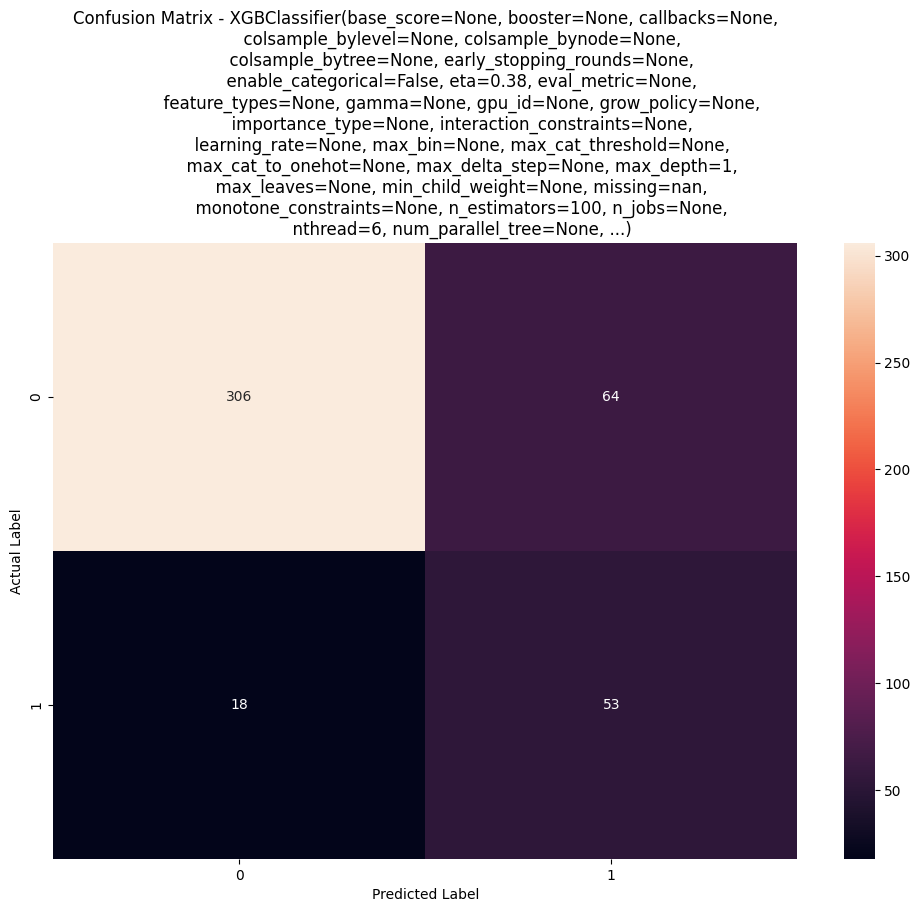

In [ ]:
confusion(xg)

###### **Feature Importance**

Text(0.5, 1.0, 'Permutation Feature Importance')

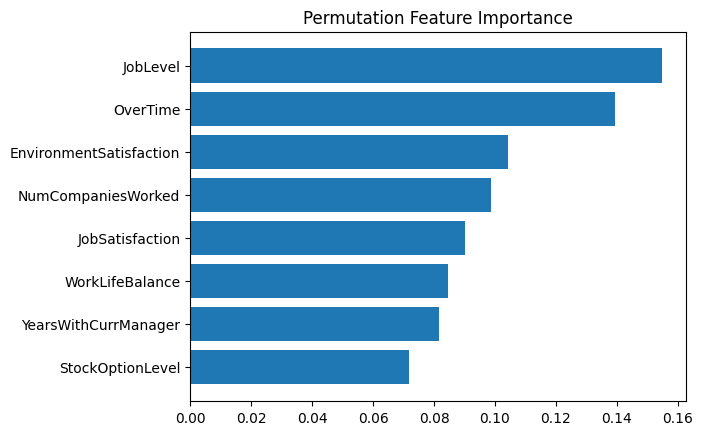

In [ ]:
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(xg, Xtest, ytest, n_repeats = 10, random_state= 13, scoring = 'recall')
sorted_idx = perm_importance.importances_mean.argsort()[-8:]
plt.barh(range(len(sorted_idx)), perm_importance.importances_mean[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(Xtest.columns)[sorted_idx])
plt.title('Permutation Feature Importance')


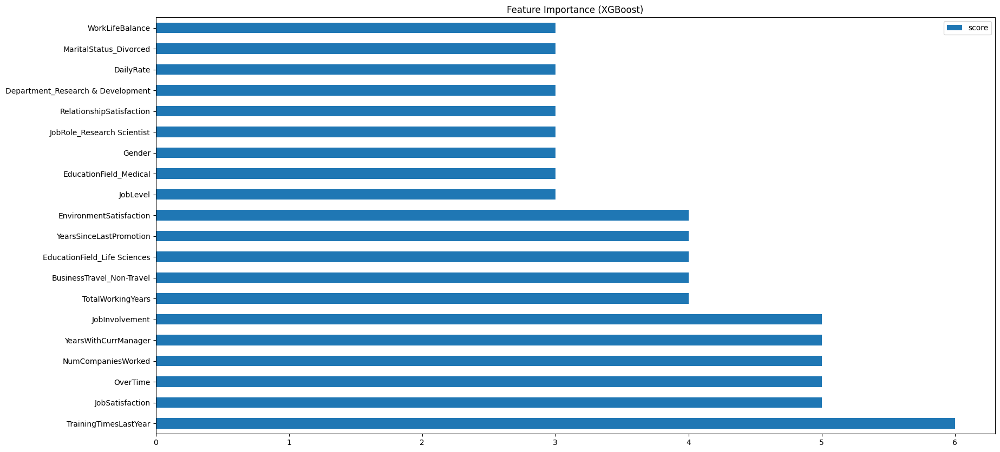

In [ ]:
# @title
feature_importance = xg.get_booster().get_score()
keys = list(feature_importance.keys())
values = list(feature_importance.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(20, columns="score").plot(kind='barh', figsize = (20,10)) ## plot top 40 features
plt.title('Feature Importance (XGBoost)')
plt.show()